Load the California housing datasets, one source is sklearn

Inspect the datasets

Perform EDA analysis techniques on the dataset

Display visualizations to explain the results of the analysis

In [ ]:
from sklearn.datasets import fetch_california_housing
import seaborn as sns
import altair as alt
import numpy as np

alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [ ]:
data = fetch_california_housing(as_frame=True)

In [ ]:
data.keys()

dict_keys(['data', 'target', 'frame', 'target_names', 'feature_names', 'DESCR'])

In [ ]:
print(data.DESCR)

.. _california_housing_dataset:

California Housing dataset
--------------------------

**Data Set Characteristics:**

    :Number of Instances: 20640

    :Number of Attributes: 8 numeric, predictive attributes and the target

    :Attribute Information:
        - MedInc        median income in block
        - HouseAge      median house age in block
        - AveRooms      average number of rooms
        - AveBedrms     average number of bedrooms
        - Population    block population
        - AveOccup      average house occupancy
        - Latitude      house block latitude
        - Longitude     house block longitude

    :Missing Attribute Values: None

This dataset was obtained from the StatLib repository.
http://lib.stat.cmu.edu/datasets/

The target variable is the median house value for California districts.

This dataset was derived from the 1990 U.S. census, using one row per census
block group. A block group is the smallest geographical unit for which the U.S.
Census Bur

In [ ]:
data.feature_names

['MedInc',
 'HouseAge',
 'AveRooms',
 'AveBedrms',
 'Population',
 'AveOccup',
 'Latitude',
 'Longitude']

In [ ]:
data.target_names

['MedHouseVal']

In [ ]:
df = data["data"]

In [ ]:
df.head()


,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25


In [ ]:
df['MedHouseVal'] = data.target

In [ ]:
df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


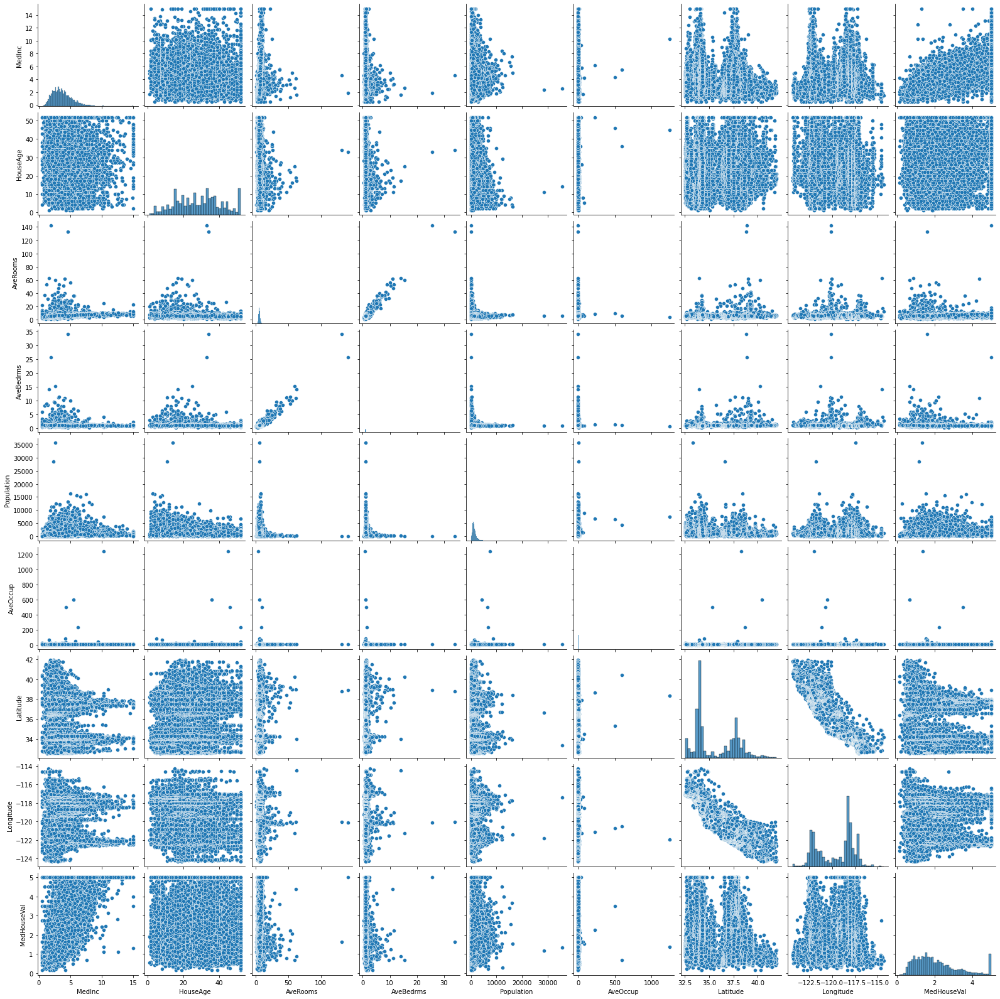

In [ ]:
sns.pairplot(df)

In [ ]:
Unfortunate to see none of the features are properly correlated with the target variable. Let's take a closer look at Median Income vs Median House Value

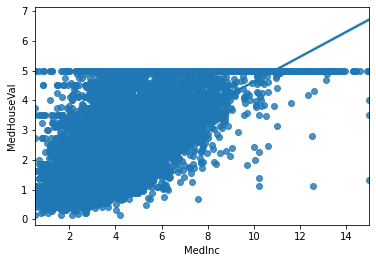

In [ ]:
sns.regplot(x = "MedInc", y = "MedHouseVal", data= df)

In [ ]:
chart = alt.Chart(df).mark_point(opacity=0.2).encode(
    x='MedInc',
    y='MedHouseVal'
)

chart + chart.transform_regression('MedInc', 'MedHouseVal').mark_line(color='red')


alt.LayerChart(...)

In [ ]:
def altair_plotter(x, degs=4, opacity=0.05):
    degree_list = np.arange(1, degs+1)

    base = alt.Chart(df).mark_circle(color="black", opacity=opacity).encode(
            alt.X(x), alt.Y("MedHouseVal")
    )

    polynomial_fit = [
        base.transform_regression(
            x, "MedHouseVal", method="poly", order=order, as_=[x, str(order)]
        )
        .mark_line()
        .properties(width=800, height=550)
        .transform_fold([str(order)], as_=["degree", "MedHouseVal"])
        .encode(alt.Color("degree:N"))
        for order in degree_list
    ]

    return alt.layer(base, *polynomial_fit)

In [ ]:
altair_plotter("MedInc")

alt.LayerChart(...)

In [ ]:
altair_plotter("HouseAge")

alt.LayerChart(...)

In [ ]:
altair_plotter("AveRooms", opacity=0.5)

In [ ]:
altair_plotter("AveBedrms", opacity=0.5)

In [ ]:
altair_plotter("Population", opacity=0.5)

In [ ]:
altair_plotter("AveOccup", opacity=0.5)